In [4]:
import osmnx as ox

# Define the place name or address
place_name = "Dhaka, Bangladesh"

# Download the street network graph for the specified place
G = ox.graph_from_place(place_name, network_type='drive')

# Save the graph as a GraphML file

In [7]:
ox.save_graphml(G, r'C:\Users\nirob\OneDrive\Desktop\LTMS\Dhaka\dhaka_drive.graphml')
print('done')

done


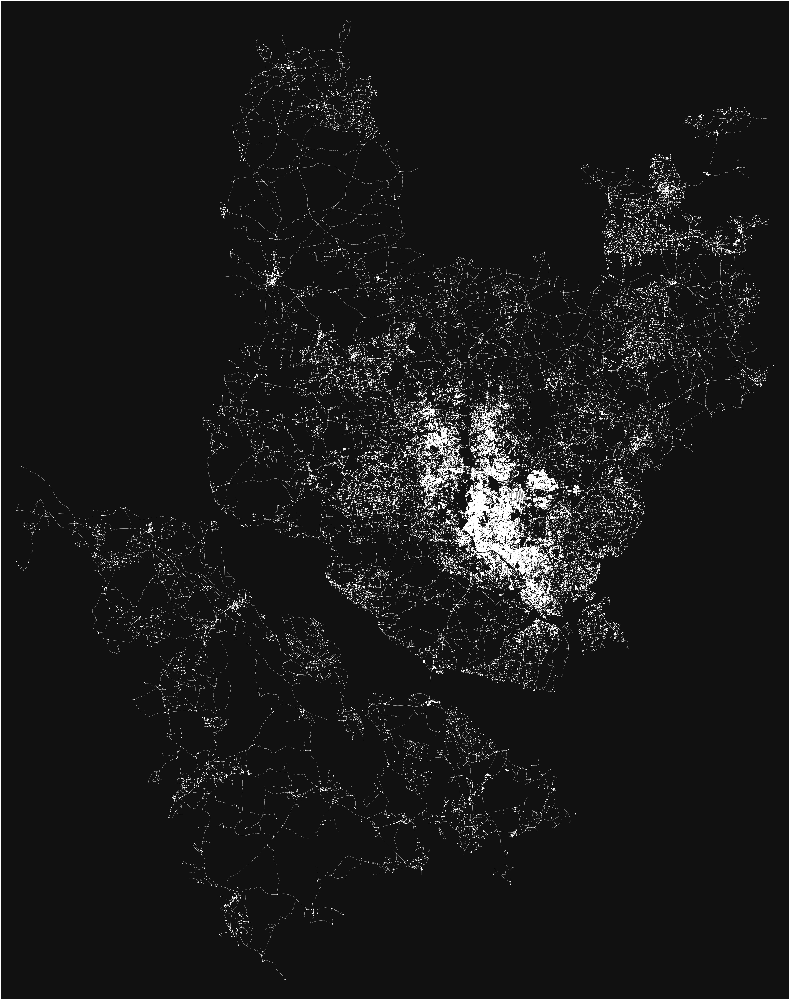

In [10]:
import networkx as nx
import matplotlib.pyplot as plt
import osmnx as ox

# Load the pre-downloaded graph for a city (replace 'your_city_graph.graphml' with the file path of your pre-downloaded graph)
l = ox.load_graphml(r'C:\Users\nirob\OneDrive\Desktop\LTMS\Dhaka\dhaka_drive.graphml')

# Plot the graph
ox.plot_graph(l, figsize=(100, 100))

# Show the plot
plt.show()

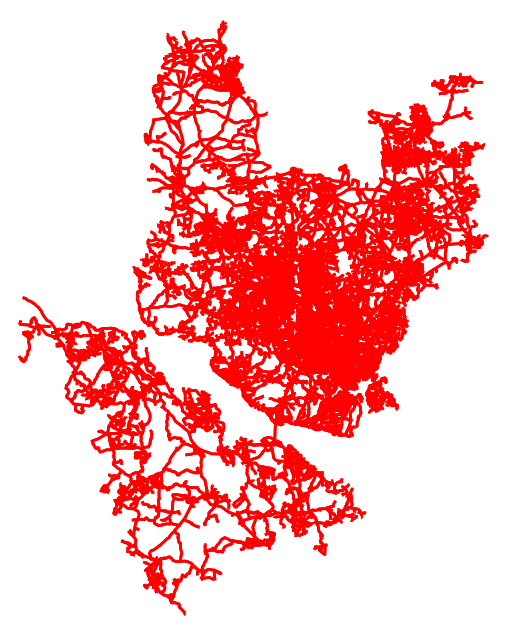

The distance between the locations is 11556.201000000005 meters.


In [4]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt

# Load the pre-downloaded graph for a city (replace 'your_city_graph.graphml' with the file path of your pre-downloaded graph)
G = ox.load_graphml(r'C:\Users\nirob\OneDrive\Desktop\LTMS\Dhaka\dhaka_drive.graphml')

# Define the two locations (replace the latitude and longitude values with your desired locations)
latitude1 = 23.7897368
longitude1 = 90.3508073
latitude2 = 23.709660
longitude2 = 90.369015
location1 = (latitude1, longitude1)
location2 = (latitude2, longitude2)

# Find the nearest network nodes to the locations
node1 = ox.distance.nearest_nodes(G, longitude1, latitude1)
node2 = ox.distance.nearest_nodes(G, longitude2, latitude2)

# Calculate the shortest path between the nodes
shortest_path = nx.shortest_path(G, node1, node2, weight='length')

# Calculate the shortest path distance
distance = nx.shortest_path_length(G, node1, node2, weight='length')

# Create a subgraph for the shortest path
subgraph = G.subgraph(shortest_path)

# Plot the subgraph with the shortest path
fig, ax = ox.plot_graph_route(G, shortest_path, route_linewidth=6, node_size=0, bgcolor='w', edge_color='r', edge_linewidth=2)

# Add markers for the locations
ax.scatter([longitude1, longitude2], [latitude1, latitude2], c='b', edgecolor='k', s=100, zorder=5)

# Show the plot
plt.show()

print(f"The distance between the locations is {distance} meters.")


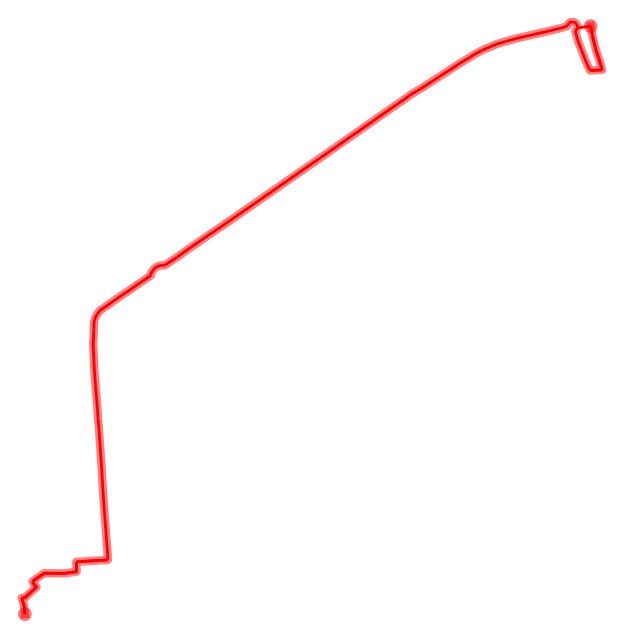

The distance between the locations is 3451.5870000000004 meters.
[4483800550, 4483800563, 4483800569, 4483800698, 4483800725, 7309773560, 382025233, 4611086956, 4610987232, 3556716563, 4611068330, 9743719908, 4611068332, 382026832, 6264828259, 3016305878, 3516792732, 3516782011, 3516778884, 3516778888, 386278293, 264879935, 10185929810, 10185929808, 3508724279, 6102676820, 264877826, 10185929812, 3713356506, 1553073589, 3508724260, 1553073590, 3508724263, 3508724253, 2541469820, 264877457, 4486376030, 386791284, 386791281, 4601103097, 4597658774, 3732380480]


In [10]:
latitude1 = 23.7897368
longitude1 = 90.3508073
latitude2 = 23.807334
longitude2 = 90.369272
location1 = (latitude1, longitude1)
location2 = (latitude2, longitude2)

# Find the nearest network nodes to the locations
node1 = ox.distance.nearest_nodes(G, longitude1, latitude1)
node2 = ox.distance.nearest_nodes(G, longitude2, latitude2)

# Calculate the shortest path between the nodes
shortest_path = nx.shortest_path(G, node1, node2, weight='length')

# Calculate the shortest path distance
distance = nx.shortest_path_length(G, node1, node2, weight='length')

# Create a subgraph for the shortest path
subgraph = G.subgraph(shortest_path)

# Plot the subgraph with the shortest path
fig, ax = ox.plot_graph_route(subgraph, shortest_path, route_linewidth=6, node_size=0, bgcolor='w', edge_color='r', edge_linewidth=2)

# Add markers for the locations
ax.scatter([longitude1, longitude2], [latitude1, latitude2], c='b', edgecolor='k', s=100, zorder=5)

# Show the plot
plt.show()

print(f"The distance between the locations is {distance} meters.")
print(shortest_path)

In [11]:
import osmnx as ox
route_map = ox.plot_route_folium(G, shortest_path)
plt.show()
route_map.save('test.html')

C:\Users\nirob\AppData\Local\Temp\ipykernel_12128\3622440844.py:2: UserWarning: The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  route_map = ox.plot_route_folium(G, shortest_path)


c:\Users\nirob\AppData\Local\Programs\Python\Python311\Lib\site-packages\taxicab\distance.py:42: UserWarning: The `get_route_edge_attributes` function has been deprecated and will be removed in a future release. Use the `route_to_gdf` function instead.
  dist += sum(get_route_edge_attributes(G, nx_route, 'length'))


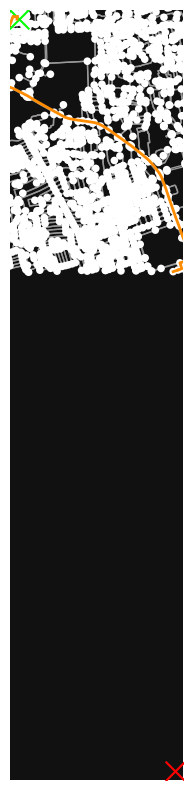

In [12]:
import osmnx as ox
import taxicab as tc
import matplotlib.pyplot as plt

latitude1 = 23.7897368
longitude1 = 90.3508073
latitude2 = 23.709660
longitude2 = 90.369015

G = ox.graph_from_point((latitude1, longitude1), dist=3000, network_type='drive')
G = ox.speed.add_edge_speeds(G)
G = ox.speed.add_edge_travel_times(G)


orig = (latitude1, longitude1)
dest = (latitude2, longitude2)

route = tc.distance.shortest_path(G, orig, dest)

fig, ax = tc.plot.plot_graph_route(G, route, node_size=30, show=False, close=False, figsize=(10,10))
padding = 0.001
ax.scatter(orig[1], orig[0], c='lime', s=200, label='orig', marker='x')
ax.scatter(dest[1], dest[0], c='red', s=200, label='dest', marker='x')
ax.set_ylim([min([orig[0], dest[0]])-padding, max([orig[0], dest[0]])+padding])
ax.set_xlim([min([orig[1], dest[1]])-padding, max([orig[1], dest[1]])+padding])
plt.show()

In [23]:
route_dist, route, orig_edge_p, dest_edge_p = tc.distance.shortest_path(G, orig, dest, orig_edge=None, dest_edge=None)
tc.distance.compute_taxi_length(G, route, orig, dest)
route

c:\Users\nirob\AppData\Local\Programs\Python\Python311\Lib\site-packages\taxicab\distance.py:42: UserWarning: The `get_route_edge_attributes` function has been deprecated and will be removed in a future release. Use the `route_to_gdf` function instead.
  dist += sum(get_route_edge_attributes(G, nx_route, 'length'))


TypeError: unsupported operand type(s) for +: 'float' and 'NoneType'

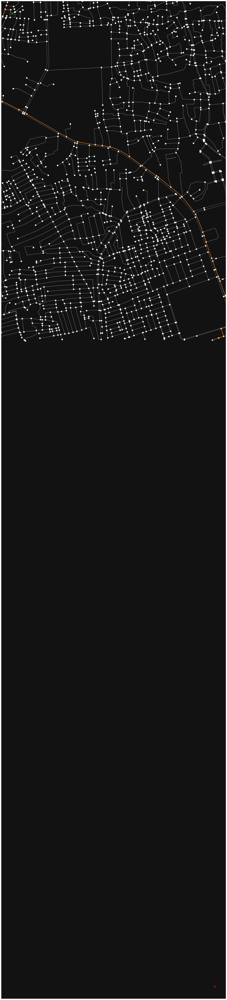

In [15]:
fig, ax = tc.plot.plot_graph_route(G, route, node_size=70, show=False, close=False, figsize=(100,100))
padding = 0.001
ax.scatter(orig[1], orig[0], c='lime', s=200, label='orig', marker='x')
ax.scatter(dest[1], dest[0], c='red', s=200, label='dest', marker='x')
ax.set_ylim([min([orig[0], dest[0]])-padding, max([orig[0], dest[0]])+padding])
ax.set_xlim([min([orig[1], dest[1]])-padding, max([orig[1], dest[1]])+padding])
plt.show()